## **Explicabilidad de modelos de Machine Learning tipo caja negra**

Para desarrollar el análisis comparativo de los algoritmos de explicabilidad LIME y SHAP se siguen los siguientes pasos:

* Análisis descriptivo
* Selección de variables
* Construcción de modelos (Árbol de desición, Regresión Logística, Random Forest y XGBoost)
* Aplicación algoritmos LIME y SHAP

Referencias:

* https://www.kaggle.com/sohommajumder21/medical-cost-8-models-90-accuracy

* https://www.kaggle.com/jirakst/titanic-auc-92

* https://machinelearningmastery.com/data-preparation-gradient-boosting-xgboost-python/

* https://github.com/marcotcr/lime

* https://lime-ml.readthedocs.io/en/latest/lime.html

* https://github.com/slundberg/shap

* https://shap.readthedocs.io/en/latest/generated/shap.explainers.Tree.html

* https://medium.com/@jboscomendoza/tutorial-xgboost-en-python-53e48fc58f73

* Random Forest con Python by Joaquín Amat Rodrigo, available under a Attribution 4.0 International (CC BY 4.0) at https://www.cienciadedatos.net/documentos/py08_random_forest_python.html

* Árboles de decisión con Python: regresión y clasificación by Joaquín Amat Rodrigo, available under a Attribution 4.0 International (CC BY 4.0) at https://www.cienciadedatos.net/documentos/py07_arboles_decision_python.html

* Regresión logística con Python by Joaquín Amat Rodrigo, available under a Attribution 4.0 International (CC BY 4.0) at https://www.cienciadedatos.net/documentos/py17-regresion-logistica-python.html

**Carga de librerias**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.gridspec as grid_spec
import seaborn as sns
%matplotlib inline
import plotly.express as px
import copy
import statsmodels.api as sm
import warnings
warnings.filterwarnings('once')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Haciendo conexión a Drive

In [2]:
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


Carga datos

In [3]:
datos_full=pd.read_csv("/content/drive/MyDrive/Base_TFM/datos_bank_export.csv")
datos_full.head()

,Edad,Trabajo,Estado_civil,Educacion,Credito_incumplido,Credito_vivienda,Credito_prestamo,Tipo_contacto,Mes_ultcontact,Dia_semana_ultcontact,Duracion_ultcontact,Nro_contactos_actual,Nro_dias_contacto_previo,Nro_contactos_previo,Resultado_previo,Var_empleo,Indice_precios,Indice_confianza,Euribor3m,Nro_empleados,Suscripcion,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0,no


# **Análisis descriptivo**

In [4]:
datos_full.shape

(41188, 22)

In [5]:
pd.value_counts(datos_full["Suscripcion"])

0    36548
1     4640
Name: Suscripcion, dtype: int64

Ratio de Suscripcion:  0.11265417111780131


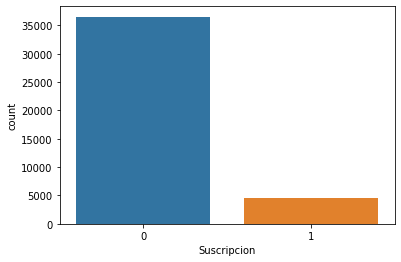

In [6]:
sns.countplot(x='Suscripcion', data=datos_full)
print("Ratio de Suscripcion: ", datos_full.Suscripcion.sum()/datos_full.Suscripcion.count())

**Medidas de tendencia central**

In [7]:
# variables numéricas
datos_full.describe()

,Edad,Duracion_ultcontact,Nro_contactos_actual,Nro_dias_contacto_previo,Nro_contactos_previo,Var_empleo,Indice_precios,Indice_confianza,Euribor3m,Nro_empleados,Suscripcion
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911,0.112654
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528,0.316173
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.000000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.000000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000,0.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.000000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000,1.000000


In [8]:
# variables categoricas
datos_full.describe(include=['O'])

,Trabajo,Estado_civil,Educacion,Credito_incumplido,Credito_vivienda,Credito_prestamo,Tipo_contacto,Mes_ultcontact,Dia_semana_ultcontact,Resultado_previo,y
count,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188
unique,12,4,8,3,3,3,2,10,5,3,2
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,nonexistent,no
freq,10422,24928,12168,32588,21576,33950,26144,13769,8623,35563,36548


(array([7.500e+01, 3.040e+02, 1.287e+03, 1.549e+03, 4.168e+03, 5.626e+03,
        3.504e+03, 4.662e+03, 3.871e+03, 2.197e+03, 3.144e+03, 2.746e+03,
        2.408e+03, 1.417e+03, 1.998e+03, 1.322e+03, 1.350e+02, 1.560e+02,
        1.160e+02, 8.100e+01, 1.210e+02, 9.000e+01, 6.100e+01, 5.100e+01,
        4.100e+01, 2.400e+01, 2.400e+01, 6.000e+00, 2.000e+00, 2.000e+00]),
 array([17. , 19.7, 22.4, 25.1, 27.8, 30.5, 33.2, 35.9, 38.6, 41.3, 44. ,
        46.7, 49.4, 52.1, 54.8, 57.5, 60.2, 62.9, 65.6, 68.3, 71. , 73.7,
        76.4, 79.1, 81.8, 84.5, 87.2, 89.9, 92.6, 95.3, 98. ]),
 <a list of 30 Patch objects>)

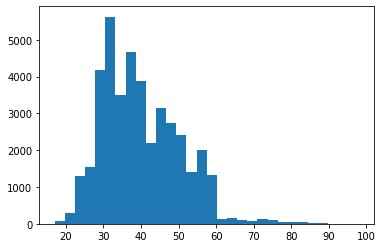

In [9]:
plt.hist(datos_full['Edad'],30)
#plt.hist(datos_full['Nro_contactos_actual'],30) # restar 1
#plt.hist(datos_full['Nro_contactos_previo']) 
#plt.hist(datos_full['Indice_precios'])
#plt.hist(datos_full['Indice_confianza'])
#plt.hist(datos_full['Nro_empleados'])

In [10]:
def tabla_distrib(variable):
  a=datos_full[[variable, 'Suscripcion']].groupby([variable], 
      as_index=False).count()
  print(a)

In [11]:
def tabla_ratio_exito(variable):
  a=datos_full[[variable, 'Suscripcion']].groupby([variable], 
      as_index=False).mean().sort_values(by='Suscripcion',ascending=False)
  print(a)

In [12]:
tabla_distrib('Trabajo')
tabla_distrib('Estado_civil')
tabla_distrib('Educacion')
tabla_distrib('Credito_incumplido')
tabla_distrib('Credito_vivienda')
tabla_distrib('Credito_prestamo')
tabla_distrib('Tipo_contacto')
tabla_distrib('Mes_ultcontact')
tabla_distrib('Dia_semana_ultcontact')
tabla_distrib('Resultado_previo')


          Trabajo  Suscripcion
0          admin.        10422
1     blue-collar         9254
2    entrepreneur         1456
3       housemaid         1060
4      management         2924
5         retired         1720
6   self-employed         1421
7        services         3969
8         student          875
9      technician         6743
10     unemployed         1014
11        unknown          330
  Estado_civil  Suscripcion
0     divorced         4612
1      married        24928
2       single        11568
3      unknown           80
             Educacion  Suscripcion
0             basic.4y         4176
1             basic.6y         2292
2             basic.9y         6045
3          high.school         9515
4           illiterate           18
5  professional.course         5243
6    university.degree        12168
7              unknown         1731
  Credito_incumplido  Suscripcion
0                 no        32588
1            unknown         8597
2                yes           

In [13]:
tabla_ratio_exito('Trabajo')
tabla_ratio_exito('Estado_civil')
tabla_ratio_exito('Educacion')
tabla_ratio_exito('Credito_incumplido')
tabla_ratio_exito('Credito_vivienda')
tabla_ratio_exito('Credito_prestamo')
tabla_ratio_exito('Tipo_contacto')
tabla_ratio_exito('Mes_ultcontact')
tabla_ratio_exito('Dia_semana_ultcontact')
tabla_ratio_exito('Resultado_previo')


          Trabajo  Suscripcion
8         student     0.314286
5         retired     0.252326
10     unemployed     0.142012
0          admin.     0.129726
4      management     0.112175
11        unknown     0.112121
9      technician     0.108260
6   self-employed     0.104856
3       housemaid     0.100000
2    entrepreneur     0.085165
7        services     0.081381
1     blue-collar     0.068943
  Estado_civil  Suscripcion
3      unknown     0.150000
2       single     0.140041
0     divorced     0.103209
1      married     0.101573
             Educacion  Suscripcion
4           illiterate     0.222222
7              unknown     0.145003
6    university.degree     0.137245
5  professional.course     0.113485
3          high.school     0.108355
0             basic.4y     0.102490
1             basic.6y     0.082024
2             basic.9y     0.078246
  Credito_incumplido  Suscripcion
0                 no      0.12879
1            unknown      0.05153
2                yes      0.000

**Correlaciones**

In [14]:
def correlation_heatmap(df, method):
    _ , ax = plt.subplots(figsize =(10, 8))
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    _ = sns.heatmap(
        df.corr(method=method),
        cmap = colormap,
        square=True, 
        annot=True, 
        annot_kws={'fontsize':9 }
    )
    
    plt.title('Matriz de correlaciones', y=1.05, size=15)

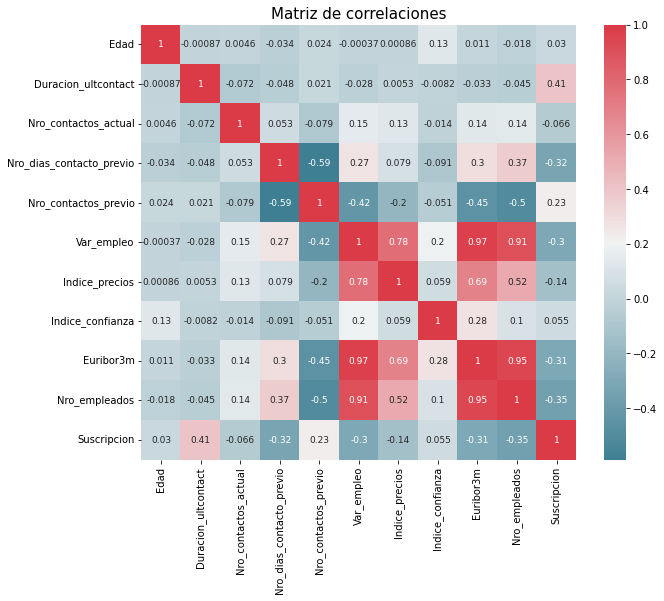

In [15]:
correlation_heatmap(datos_full, 'pearson')

**TRANSFORMANDO VARIABLES**

**imputando outliers**

In [16]:
# restando 1 a la variable Nro_contactos_actual
datos_full['Nro_contactos_actual_2']=datos_full['Nro_contactos_actual']-1
datos_full.loc[datos_full['Nro_contactos_actual_2'] >= 13, 'Nro_contactos_actual_2'] = 13

datos_full[datos_full['Nro_contactos_actual_2'] >= 13]

,Edad,Trabajo,Estado_civil,Educacion,Credito_incumplido,Credito_vivienda,Credito_prestamo,Tipo_contacto,Mes_ultcontact,Dia_semana_ultcontact,Duracion_ultcontact,Nro_contactos_actual,Nro_dias_contacto_previo,Nro_contactos_previo,Resultado_previo,Var_empleo,Indice_precios,Indice_confianza,Euribor3m,Nro_empleados,Suscripcion,y,Nro_contactos_actual_2
2631,48,technician,single,unknown,no,unknown,unknown,telephone,may,tue,69,19,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,0,no,13
2981,48,services,married,high.school,no,no,no,telephone,may,wed,17,18,999,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,0,no,13
3219,39,blue-collar,married,basic.9y,no,no,no,telephone,may,thu,651,23,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,1,yes,13
3360,27,unemployed,married,basic.9y,no,no,no,telephone,may,thu,84,14,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,0,no,13
3370,31,admin.,single,high.school,no,no,no,telephone,may,thu,132,22,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,0,no,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34509,50,services,divorced,high.school,no,yes,no,cellular,may,thu,199,15,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,0,no,13
35272,32,admin.,single,high.school,no,no,yes,cellular,may,fri,284,15,999,0,nonexistent,-1.8,92.893,-46.2,1.250,5099.1,0,no,13
35441,36,admin.,married,high.school,unknown,no,no,cellular,may,mon,11,14,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,0,no,13
36884,56,self-employed,married,university.degree,no,yes,no,telephone,jun,thu,390,15,999,0,nonexistent,-2.9,92.963,-40.8,1.235,5076.2,0,no,13


In [17]:
np.percentile(datos_full['Nro_contactos_actual_2'], 99)

13.0

**Agrupando categorias**

In [18]:
# agrupando categorias por semestre
datos_full['Mes_ultcontact_2']=''
datos_full.loc[datos_full['Mes_ultcontact'] == 'mar', 'Mes_ultcontact_2'] = 'Semestre_1'
datos_full.loc[datos_full['Mes_ultcontact'] == 'apr', 'Mes_ultcontact_2'] = 'Semestre_1'
datos_full.loc[datos_full['Mes_ultcontact'] == 'may', 'Mes_ultcontact_2'] = 'Semestre_1'
datos_full.loc[datos_full['Mes_ultcontact'] == 'jun', 'Mes_ultcontact_2'] = 'Semestre_1'

datos_full.loc[datos_full['Mes_ultcontact'] == 'jul', 'Mes_ultcontact_2'] = 'Semestre_2'
datos_full.loc[datos_full['Mes_ultcontact'] == 'aug', 'Mes_ultcontact_2'] = 'Semestre_2'
datos_full.loc[datos_full['Mes_ultcontact'] == 'sep', 'Mes_ultcontact_2'] = 'Semestre_2'
datos_full.loc[datos_full['Mes_ultcontact'] == 'oct', 'Mes_ultcontact_2'] = 'Semestre_2'
datos_full.loc[datos_full['Mes_ultcontact'] == 'nov', 'Mes_ultcontact_2'] = 'Semestre_2'
datos_full.loc[datos_full['Mes_ultcontact'] == 'dec', 'Mes_ultcontact_2'] = 'Semestre_2'

**Eliminando variables**

In [19]:
# eliminando variables por el criterio de alta correlación y por ser post predicción
datos_full_v2=copy.deepcopy(datos_full)
datos_full_v3 = datos_full_v2.drop(['y','Duracion_ultcontact','Var_empleo','Nro_empleados','Nro_contactos_actual','Nro_dias_contacto_previo','Credito_incumplido','Mes_ultcontact','Indice_precios'], axis = 1)
datos_full_v3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Edad                    41188 non-null  int64  
 1   Trabajo                 41188 non-null  object 
 2   Estado_civil            41188 non-null  object 
 3   Educacion               41188 non-null  object 
 4   Credito_vivienda        41188 non-null  object 
 5   Credito_prestamo        41188 non-null  object 
 6   Tipo_contacto           41188 non-null  object 
 7   Dia_semana_ultcontact   41188 non-null  object 
 8   Nro_contactos_previo    41188 non-null  int64  
 9   Resultado_previo        41188 non-null  object 
 10  Indice_confianza        41188 non-null  float64
 11  Euribor3m               41188 non-null  float64
 12  Suscripcion             41188 non-null  int64  
 13  Nro_contactos_actual_2  41188 non-null  int64  
 14  Mes_ultcontact_2        41188 non-null

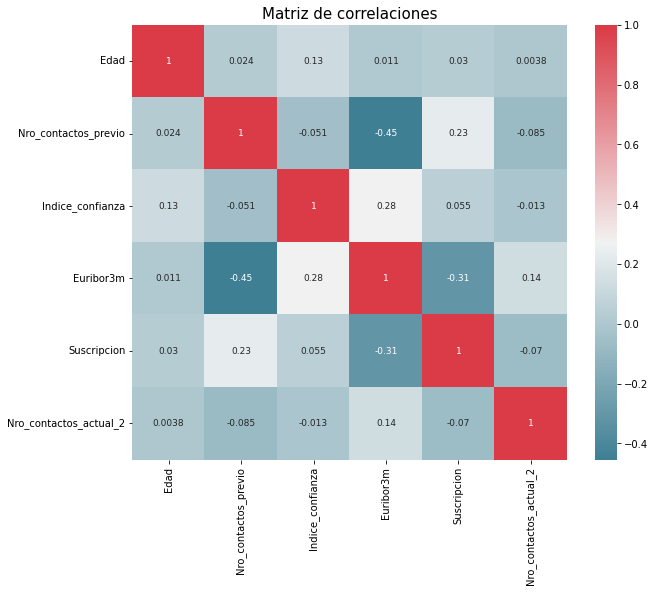

In [20]:
# correlación de la variables numéricas restantes
correlation_heatmap(datos_full_v3, 'pearson')

**Separando variables categóricas y numéricas para aplicar one hot encoding**

In [21]:
# Creando una tabla solo con las variables numéricas
datos_categoricos=['Trabajo','Estado_civil','Educacion','Credito_vivienda','Credito_prestamo','Tipo_contacto','Mes_ultcontact_2','Dia_semana_ultcontact','Resultado_previo']
datos_full_numericas = datos_full_v3.drop(datos_categoricos, axis = 1)
datos_full_numericas.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Suscripcion,Nro_contactos_actual_2
0,56,0,-36.4,4.857,0,0
1,57,0,-36.4,4.857,0,0
2,37,0,-36.4,4.857,0,0
3,40,0,-36.4,4.857,0,0
4,56,0,-36.4,4.857,0,0


In [22]:
datos_full_numericas.shape

(41188, 6)

In [23]:
# Creando una tabla solo con las variables categoricas
datos_numericos=['Edad','Nro_contactos_actual_2','Nro_contactos_previo','Indice_confianza','Euribor3m','Suscripcion']
datos_full_categoricas = datos_full_v3.drop(datos_numericos, axis = 1)
datos_full_categoricas.head()

,Trabajo,Estado_civil,Educacion,Credito_vivienda,Credito_prestamo,Tipo_contacto,Dia_semana_ultcontact,Resultado_previo,Mes_ultcontact_2
0,housemaid,married,basic.4y,no,no,telephone,mon,nonexistent,Semestre_1
1,services,married,high.school,no,no,telephone,mon,nonexistent,Semestre_1
2,services,married,high.school,yes,no,telephone,mon,nonexistent,Semestre_1
3,admin.,married,basic.6y,no,no,telephone,mon,nonexistent,Semestre_1
4,services,married,high.school,no,yes,telephone,mon,nonexistent,Semestre_1


In [24]:
datos_full_categoricas.shape

(41188, 9)

**Aplicando one hot encoding**

In [25]:
# Guardando los nombres de las variables categóricas
columns_names = datos_full_categoricas.columns.values
columns_names

array(['Trabajo', 'Estado_civil', 'Educacion', 'Credito_vivienda',
       'Credito_prestamo', 'Tipo_contacto', 'Dia_semana_ultcontact',
       'Resultado_previo', 'Mes_ultcontact_2'], dtype=object)

In [27]:
# Aplicando one hot enconding a las variables categóricas y almacenando en un array
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
datos_full_categoricas_enc=enc.fit_transform(datos_full_categoricas).toarray()
datos_full_categoricas_enc.shape

(41188, 42)

In [28]:
# Generando los nombres de las nuevas  columnas
columnas=enc.get_feature_names(columns_names)
columnas.shape

(42,)

**convirtiendo datos a Dataframe**

In [29]:
# Convirtiendo el array con las nuevas variables a un Dataframe
datos_full_categoricas_v2=pd.DataFrame(datos_full_categoricas_enc, columns=columnas, index=None)
datos_full_categoricas_v2.head()

,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Trabajo_unknown,Estado_civil_divorced,Estado_civil_married,Estado_civil_single,Estado_civil_unknown,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_illiterate,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_no,Credito_vivienda_unknown,Credito_vivienda_yes,Credito_prestamo_no,Credito_prestamo_unknown,Credito_prestamo_yes,Tipo_contacto_cellular,Tipo_contacto_telephone,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_failure,Resultado_previo_nonexistent,Resultado_previo_success,Mes_ultcontact_2_Semestre_1,Mes_ultcontact_2_Semestre_2
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [30]:
# concatenando bases numericas y categoricas binarizadas
from pandas import concat
datos_full_v4 = concat([datos_full_numericas,datos_full_categoricas_v2],join="inner",axis=1)
datos_full_v4.shape

(41188, 48)

In [31]:
datos_full_v4.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Suscripcion,Nro_contactos_actual_2,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Trabajo_unknown,Estado_civil_divorced,Estado_civil_married,Estado_civil_single,Estado_civil_unknown,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_illiterate,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_no,Credito_vivienda_unknown,Credito_vivienda_yes,Credito_prestamo_no,Credito_prestamo_unknown,Credito_prestamo_yes,Tipo_contacto_cellular,Tipo_contacto_telephone,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_failure,Resultado_previo_nonexistent,Resultado_previo_success,Mes_ultcontact_2_Semestre_1,Mes_ultcontact_2_Semestre_2
0,56,0,-36.4,4.857,0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,57,0,-36.4,4.857,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,37,0,-36.4,4.857,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,40,0,-36.4,4.857,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,56,0,-36.4,4.857,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


**Eliminando categorias con poca frecuencia**

In [32]:
# eliminando variables que vienen de categorias con poca frecuencia
datos_full_v5=copy.deepcopy(datos_full_v4)
datos_full_v6 = datos_full_v5.drop(['Trabajo_unknown','Estado_civil_unknown','Educacion_illiterate'], axis = 1)
datos_full_v6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 45 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Edad                           41188 non-null  int64  
 1   Nro_contactos_previo           41188 non-null  int64  
 2   Indice_confianza               41188 non-null  float64
 3   Euribor3m                      41188 non-null  float64
 4   Suscripcion                    41188 non-null  int64  
 5   Nro_contactos_actual_2         41188 non-null  int64  
 6   Trabajo_admin.                 41188 non-null  float64
 7   Trabajo_blue-collar            41188 non-null  float64
 8   Trabajo_entrepreneur           41188 non-null  float64
 9   Trabajo_housemaid              41188 non-null  float64
 10  Trabajo_management             41188 non-null  float64
 11  Trabajo_retired                41188 non-null  float64
 12  Trabajo_self-employed          41188 non-null 

In [33]:
datos_full_v6.shape

(41188, 45)

**Correlación de variables resultantes**

In [34]:
correlacion_pearson=datos_full_v6.corr(method='pearson')
correlacion_spearman=datos_full_v6.corr(method='spearman')

correlacion_pearson.to_excel('/content/drive/MyDrive/Base_TFM/correlacion_pearson.xlsx')
correlacion_spearman.to_excel('/content/drive/MyDrive/Base_TFM/correlacion_spearman.xlsx')

**Eliminando categorias con alta correlación**

In [35]:
# eliminando variables por el criterio de alta correlación 
datos_full_v7=copy.deepcopy(datos_full_v6)
datos_full_v8 = datos_full_v7.drop(['Estado_civil_married','Credito_vivienda_no','Credito_vivienda_unknown','Credito_prestamo_no','Credito_prestamo_unknown','Tipo_contacto_telephone','Resultado_previo_failure','Resultado_previo_nonexistent','Mes_ultcontact_2_Semestre_1'], axis = 1)
datos_full_v8.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 36 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Edad                           41188 non-null  int64  
 1   Nro_contactos_previo           41188 non-null  int64  
 2   Indice_confianza               41188 non-null  float64
 3   Euribor3m                      41188 non-null  float64
 4   Suscripcion                    41188 non-null  int64  
 5   Nro_contactos_actual_2         41188 non-null  int64  
 6   Trabajo_admin.                 41188 non-null  float64
 7   Trabajo_blue-collar            41188 non-null  float64
 8   Trabajo_entrepreneur           41188 non-null  float64
 9   Trabajo_housemaid              41188 non-null  float64
 10  Trabajo_management             41188 non-null  float64
 11  Trabajo_retired                41188 non-null  float64
 12  Trabajo_self-employed          41188 non-null 

In [36]:
datos_full_v8.shape

(41188, 36)

**Correlación variables finales**

In [37]:
correlacion_pearson_v2=datos_full_v8.corr(method='pearson')
correlacion_spearman_v2=datos_full_v8.corr(method='spearman')

correlacion_pearson_v2.to_excel('/content/drive/MyDrive/Base_TFM/correlacion_pearson_v2.xlsx')
correlacion_spearman_v2.to_excel('/content/drive/MyDrive/Base_TFM/correlacion_spearman_v2.xlsx')

**Dividiendo base en Train y Test**

In [39]:
X_data = datos_full_v8.drop(['Suscripcion'], axis = 1)
y_data = datos_full_v8['Suscripcion']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size = 0.3, random_state = 42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(28831, 35)
(12357, 35)
(28831,)
(12357,)


# **DESARROLLANDO MODELO RANDOM FOREST**

In [41]:
# Preprocesado y modelado
# ==============================================================================
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance
import multiprocessing

**GRIDSEARCH**

In [42]:
# Grid de hiperparámetros evaluados
param_grid = ParameterGrid(
                {'n_estimators': [100, 150, 200],           # número de árboles incluidos en el modelo
                 'min_samples_leaf': [50, 100, 1000, 1500],# número mínimo de observaciones que debe de tener cada uno de los nodos hijos para que se produzca la división.
                 'max_features': [5, 10, 15, 20],         # número de predictores considerados a en cada división
                 'max_depth'   : [5, 10, 20]   # profundidad máxima que pueden alcanzar los árboles.
                }
            )

In [43]:
# Loop para ajustar un modelo con cada combinación de hiperparámetros
resultados = {'params': [], 'oob_accuracy': []}

for params in param_grid:
    modelo_rforest = RandomForestClassifier(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                ** params
             )
    
    modelo_rforest.fit(X_train, y_train)
    
    resultados['params'].append(params)
    resultados['oob_accuracy'].append(modelo_rforest.oob_score_)
    print(f"Modelo: {params} \u2713")

Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 50, 'n_estimators': 100} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 50, 'n_estimators': 150} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 50, 'n_estimators': 200} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 100, 'n_estimators': 100} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 100, 'n_estimators': 150} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 100, 'n_estimators': 200} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1000, 'n_estimators': 100} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1000, 'n_estimators': 150} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1000, 'n_estimators': 200} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1500, 'n_estimators': 100} ✓
Modelo: {'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1500, 'n_estima

In [44]:
# Resultados
resultados_2 = pd.DataFrame(resultados)
resultados_3 = pd.concat([resultados_2, resultados_2['params'].apply(pd.Series)], axis=1)
resultados_4 = resultados_3.sort_values('oob_accuracy', ascending=False)
resultados_5 = resultados_4.drop(columns = 'params')
resultados_5.head(10)

,oob_accuracy,max_depth,max_features,min_samples_leaf,n_estimators
72,0.900662,10,15,50,100
120,0.900662,20,15,50,100
134,0.900454,20,20,50,200
132,0.900454,20,20,50,100
133,0.900420,20,20,50,150
74,0.900385,10,15,50,200
73,0.900316,10,15,50,150
121,0.900246,20,15,50,150
86,0.900246,10,20,50,200
122,0.900212,20,15,50,200


**modelo random forest con los mejores parametros**

In [45]:
    modelo_rforest = RandomForestClassifier(
                n_estimators=100, 
                 min_samples_leaf=50,
                 max_features=15,   
                 max_depth=10 ,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    
    modelo_rforest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=15,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=123, verbose=0,
                       warm_start=False)

In [46]:
predicciones_rforest_train = modelo_rforest.predict(X = X_train)
predicciones_rforest_train

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

Métricas de desempeño

In [47]:
# predicciones train
predicciones_rforest_train = modelo_rforest.predict_proba(X = X_train)
clasificacion_rforest_train = modelo_rforest.predict(X = X_train)

accuracy_rforest_train = accuracy_score( y_true    = y_train, y_pred    = clasificacion_rforest_train, normalize = True )
precision_rforest_train = precision_score( y_true    = y_train, y_pred    = clasificacion_rforest_train )
recall_rforest_train = recall_score( y_true    = y_train, y_pred    = clasificacion_rforest_train )
f1_score_rforest_train = f1_score( y_true    = y_train, y_pred    = clasificacion_rforest_train )

# predicciones test
predicciones_rforest_test = modelo_rforest.predict_proba(X = X_test)
clasificacion_rforest_test = modelo_rforest.predict(X = X_test)

accuracy_rforest_test = accuracy_score( y_true    = y_test,  y_pred    = clasificacion_rforest_test,  normalize = True  )
precision_rforest_test = precision_score( y_true    = y_test,  y_pred    = clasificacion_rforest_test)
recall_rforest_test = recall_score( y_true    = y_test,  y_pred    = clasificacion_rforest_test)
f1_score_rforest_test = f1_score( y_true    = y_test,  y_pred    = clasificacion_rforest_test)

print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train es:  {accuracy_rforest_train}")
print(f"El precision de train es: {precision_rforest_train}")
print(f"El recall de train es:    {recall_rforest_train}")
print(f"El f1 score de train es:  {f1_score_rforest_train}")

print(f"------- RESULTADOS TEST ------------------")
print(f"El accuracy de test es:  {accuracy_rforest_test}")
print(f"El precision de test es: {precision_rforest_test}")
print(f"El recall de test es:    {recall_rforest_test}")
print(f"El f1 score de test es:  {f1_score_rforest_test}")

------- RESULTADOS TRAIN ------------------
El accuracy de train es:  0.9019458222052652
El precision de train es: 0.7132796780684104
El recall de train es:    0.2180867425407567
El f1 score de train es:  0.33404004711425206
------- RESULTADOS TEST ------------------
El accuracy de test es:  0.8998138706805859
El precision de test es: 0.6819277108433734
El recall de test es:    0.20374370050395968
El f1 score de test es:  0.3137472283813747


In [48]:
# Matriz de confusión de las predicciones de TRAIN
confusion_matrix_rforest_train = pd.crosstab(
    y_train.ravel(),
    clasificacion_rforest_train,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_rforest_train

Predicción,0,1
Real,,
0,25295,285
1,2542,709


In [49]:
# Matriz de confusión de las predicciones de TEST
confusion_matrix_rforest_test = pd.crosstab(
    y_test.ravel(),
    clasificacion_rforest_test,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_rforest_test

Predicción,0,1
Real,,
0,10836,132
1,1106,283


In [50]:
importancia_predictores = pd.DataFrame(
                            {'predictor': X_train.columns,
                             'importancia': modelo_rforest.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Euribor3m,0.464221
33,Resultado_previo_success,0.199075
2,Indice_confianza,0.180036
0,Edad,0.041700
27,Tipo_contacto_cellular,0.028611
1,Nro_contactos_previo,0.023760
4,Nro_contactos_actual_2,0.010332
34,Mes_ultcontact_2_Semestre_2,0.008826
23,Educacion_university.degree,0.007805
29,Dia_semana_ultcontact_mon,0.006736


# **DESARROLLANDO MODELO XGBOOST**

In [51]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, auc, roc_curve, roc_auc_score


In [ ]:
# XGBoost Classifier
XGB = XGBClassifier(seed=123)
xgb_param = {
    'loss' : ["deviance"],
     'n_estimators' : [100,200,300],
     'learning_rate': [0.1, 0.05, 0.01],
     'max_depth': [2, 4],
     'min_samples_leaf': [1500,2000],
     'max_features': [0.3, 0.2] 
    }

gsXGB = GridSearchCV(XGB, param_grid = xgb_param, scoring="accuracy", n_jobs= 4, verbose = 1)
gsXGB.fit(X_train,y_train)
XGB_best = gsXGB.best_estimator_

# Mejor Score
gsXGB.best_score_


Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:  1.7min
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  9.9min
[Parallel(n_jobs=4)]: Done 360 out of 360 | elapsed: 19.9min finished


0.9002116471045414

In [ ]:
gsXGB.best_params_

{'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 4,
 'max_features': 0.3,
 'min_samples_leaf': 1500,
 'n_estimators': 100}

**Modelo XGBoost con parámetros ganadores**

In [52]:
%%time
modelo_xgb = xgb.XGBClassifier(learning_rate=0.1, loss= 'deviance', max_depth= 4, max_features= 0.3, min_samples_leaf= 1500, n_estimators=100, seed=123)

CPU times: user 65 µs, sys: 0 ns, total: 65 µs
Wall time: 69.4 µs


In [53]:
%%time
modelo_xgb.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:235: DeprecationWarning:

The seed parameter is deprecated as of version .6.Please use random_state instead.seed is deprecated.



CPU times: user 3.53 s, sys: 45.8 ms, total: 3.58 s
Wall time: 3.71 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, loss='deviance', max_delta_step=0, max_depth=4,
              max_features=0.3, min_child_weight=1, min_samples_leaf=1500,
              missing=None, n_estimators=100, n_jobs=1, nthread=None,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, seed=123, silent=None,
              subsample=1, verbosity=1)

In [54]:
# predicciones train
predicciones_xgb_train = modelo_xgb.predict_proba(X_train)
clasificacion_xgb_train = modelo_xgb.predict(X_train)

accuracy_xgb_train = accuracy_score( y_true    = y_train, y_pred    = clasificacion_xgb_train, normalize = True )
precision_xgb_train = precision_score( y_true    = y_train, y_pred    = clasificacion_xgb_train )
recall_xgb_train = recall_score( y_true    = y_train, y_pred    = clasificacion_xgb_train )
f1_score_xgb_train = f1_score( y_true    = y_train, y_pred    = clasificacion_xgb_train )

# predicciones test
predicciones_xgb_test = modelo_xgb.predict_proba(X_test)
clasificacion_xgb_test = modelo_xgb.predict(X_test)

accuracy_xgb_test = accuracy_score( y_true    = y_test,  y_pred    = clasificacion_xgb_test,  normalize = True  )
precision_xgb_test = precision_score( y_true    = y_test,  y_pred    = clasificacion_xgb_test)
recall_xgb_test = recall_score( y_true    = y_test,  y_pred    = clasificacion_xgb_test)
f1_score_xgb_test = f1_score( y_true    = y_test,  y_pred    = clasificacion_xgb_test)

print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train es:  {accuracy_xgb_train}")
print(f"El precision de train es: {precision_xgb_train}")
print(f"El recall de train es:    {recall_xgb_train}")
print(f"El f1 score de train es:  {f1_score_xgb_train}")

print(f"------- RESULTADOS TEST ------------------")
print(f"El accuracy de test es:  {accuracy_xgb_test}")
print(f"El precision de test es: {precision_xgb_test}")
print(f"El recall de test es:    {recall_xgb_test}")
print(f"El f1 score de test es:  {f1_score_xgb_test}")

------- RESULTADOS TRAIN ------------------
El accuracy de train es:  0.9064201727307413
El precision de train es: 0.7419072615923009
El recall de train es:    0.2608428175945863
El f1 score de train es:  0.38598088302230316
------- RESULTADOS TEST ------------------
El accuracy de test es:  0.9011086833373796
El precision de test es: 0.6680080482897385
El recall de test es:    0.23902087832973362
El f1 score de test es:  0.352067868504772


In [55]:
# Matriz de confusión de las predicciones de TRAIN
confusion_matrix_xgb_train = pd.crosstab(
    y_train.ravel(),
    clasificacion_xgb_train,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_xgb_train

Predicción,0,1
Real,,
0,25285,295
1,2403,848


In [56]:
# Matriz de confusión de las predicciones de TEST
confusion_matrix_xgb_test = pd.crosstab(
    y_test.ravel(),
    clasificacion_xgb_test,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_xgb_test

Predicción,0,1
Real,,
0,10803,165
1,1057,332


In [57]:
# Importancia de variables
importancia_predictores_xgb = pd.DataFrame(
                            {'predictor': X_train.columns,
                             'importancia': modelo_xgb.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores_xgb.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Euribor3m,0.202869
33,Resultado_previo_success,0.163397
2,Indice_confianza,0.062763
27,Tipo_contacto_cellular,0.039034
6,Trabajo_blue-collar,0.037670
34,Mes_ultcontact_2_Semestre_2,0.037060
28,Dia_semana_ultcontact_fri,0.029787
31,Dia_semana_ultcontact_tue,0.028232
1,Nro_contactos_previo,0.027647
29,Dia_semana_ultcontact_mon,0.027382


# **LIME - RANDOM FOREST**


In [58]:
pip install lime

     |████████████████████████████████| 275 kB 5.2 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=061816071070a7273b0821a67088277e8477abc1345ce4f3e06d2025a3a8eb5a
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime-0.2.0.1.dist-info/top_level.txt' mode='r' encoding='UTF-8'>



In [59]:
predicciones_rforest_test[58]

array([0.23421338, 0.76578662])

In [60]:
import lime.lime_tabular
explainer_lime_rforest = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                              mode                   = 'classification',                                           
                              feature_names          = X_train.columns.values.tolist(),   
                              class_names            = ('No Suscr.','Suscripción'),
                              feature_selection      = 'auto',
                              discretize_continuous  = True,
                              sample_around_instance = False,
                              verbose                = True,
                              random_state           = 123)                                      

In [61]:
predict_fn_rforest = lambda x: modelo_rforest.predict_proba(x).astype(float)

**OBSERVACIÓN #0**

In [62]:
exp_lime_rforest_obs_0 = explainer_lime_rforest.explain_instance(X_test.values[0], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_0.show_in_notebook(show_all=False)

Intercept 0.26756892583427627
Prediction_local [0.3331139]
Right: 0.06521845050032099


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



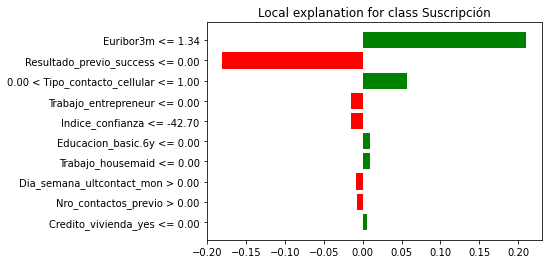

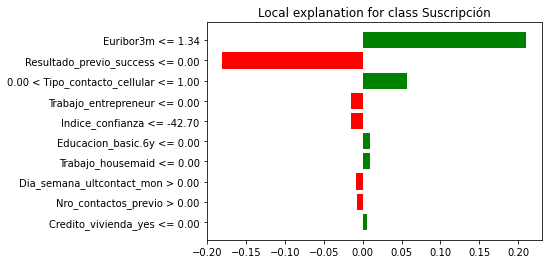

In [63]:
exp_lime_rforest_obs_0.as_pyplot_figure()

**OBSERVACIÓN #58**

In [64]:
exp_lime_rforest_obs_58 = explainer_lime_rforest.explain_instance(X_test.values[58], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_58.show_in_notebook(show_all=False)

Intercept 0.08353651482902946
Prediction_local [0.57646571]
Right: 0.7657866183398947


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



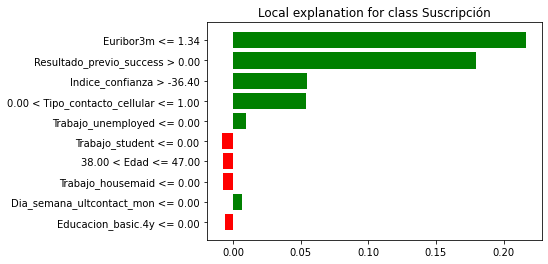

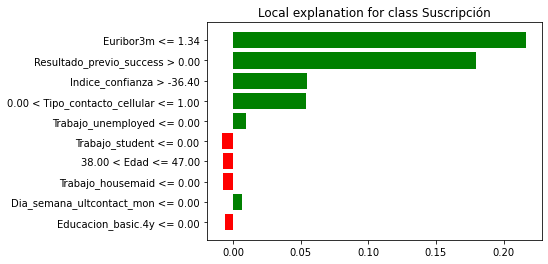

In [65]:
exp_lime_rforest_obs_58.as_pyplot_figure()

**OBSERVACIÓN #32**

In [66]:
exp_lime_rforest_obs_32 = explainer_lime_rforest.explain_instance(X_test.values[32], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_32.show_in_notebook(show_all=False)

Intercept 0.2845280826654484
Prediction_local [0.35946884]
Right: 0.4850781428658073


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



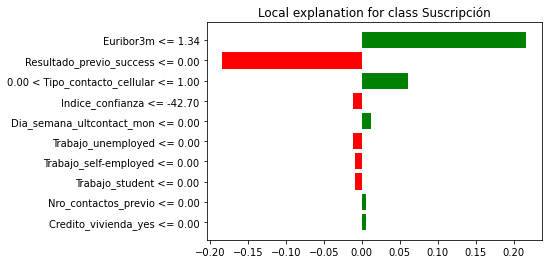

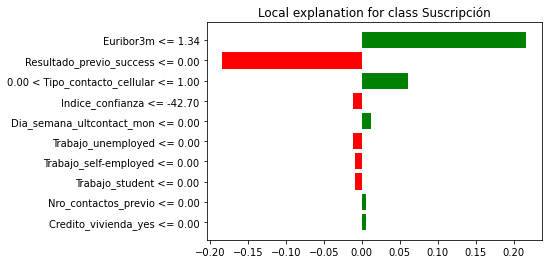

In [67]:
exp_lime_rforest_obs_32.as_pyplot_figure()

**OBSERVACIÓN #217**

In [69]:
exp_lime_rforest_obs_217 = explainer_lime_rforest.explain_instance(X_test.values[217], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_217.show_in_notebook(show_all=False)

Intercept 0.3383727202164817
Prediction_local [0.15289776]
Right: 0.3796003493854112


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



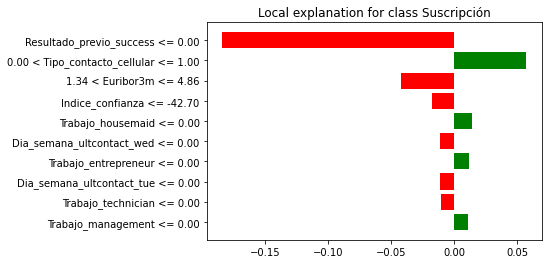

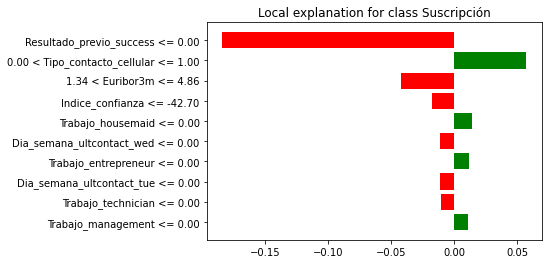

In [70]:
exp_lime_rforest_obs_217.as_pyplot_figure()

**OBSERVACIÓN #4**

In [71]:
exp_lime_rforest_obs_4 = explainer_lime_rforest.explain_instance(X_test.values[4], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_4.show_in_notebook(show_all=False)

Intercept 0.3221435331472061
Prediction_local [0.10320638]
Right: 0.05559309522907958


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



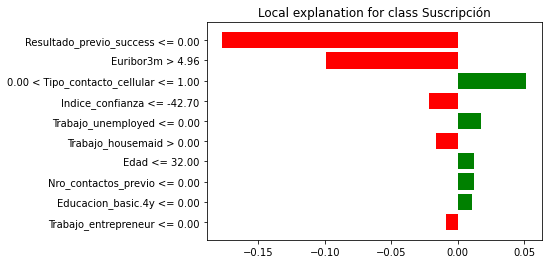

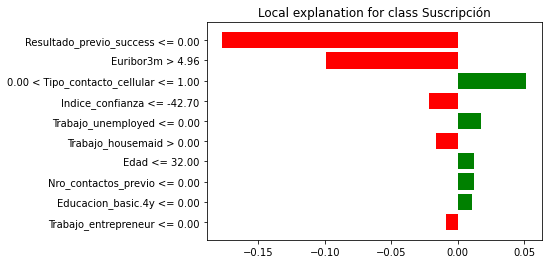

In [72]:
exp_lime_rforest_obs_4.as_pyplot_figure()

**OBSERVACIÓN #22**

In [75]:
exp_lime_rforest_obs_22 = explainer_lime_rforest.explain_instance(X_test.values[22], predict_fn_rforest,
                                                            distance_metric = 'euclidean',
                                                            num_features    = 10)
exp_lime_rforest_obs_22.show_in_notebook(show_all=False)

Intercept 0.3895968272587913
Prediction_local [0.06786634]
Right: 0.03164041470169556


/usr/local/lib/python3.7/dist-packages/lime/explanation.py:251: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/lime/bundle.js' mode='r' encoding='utf8'>



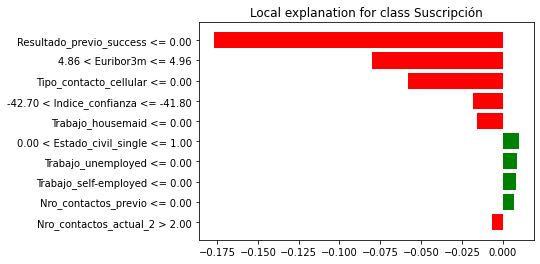

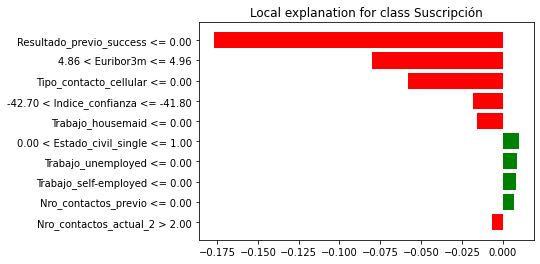

In [76]:
exp_lime_rforest_obs_22.as_pyplot_figure()

# **SHAP - RANDOM FOREST**

In [77]:
pip install shap

     |████████████████████████████████| 356 kB 5.0 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491648 sha256=f0acd8ba8827131655827ddd5b6ed149e4ee28603106aeefc79400a038fc8057
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/shap-0.39.0.dist-info/top_level.txt' mode='r' encoding='UTF-8'>

/usr/local/lib/python3.7/dist-packages/google/colab/_pip.py:87: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.7/dist-packages/slicer-0.0.7.dist-info/top_level.txt' mode='r' encoding='UTF-8'>



In [78]:
import shap

/usr/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject



In [79]:
# explicar las predicciones del modelo usando SHAP
explainer_shap_rforest = shap.Explainer(model   = modelo_rforest)

In [80]:
explainer_shap_rforest.expected_value

array([0.88719677, 0.11280323])

In [82]:
shap_values_rforest = explainer_shap_rforest(X_test)

In [83]:
# Convirtiendo el array con los shap values a un Dataframe
datos_valores_shap_rforest=pd.DataFrame(shap_values_rforest.values[:,:,1], columns=X_test.columns, index=X_test.index)
datos_valores_shap_rforest.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Nro_contactos_actual_2,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Estado_civil_divorced,Estado_civil_single,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_yes,Credito_prestamo_yes,Tipo_contacto_cellular,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_success,Mes_ultcontact_2_Semestre_2
32884,-0.002325,-0.004144,-0.023745,-0.015056,0.002861,-0.000125,0.000298,-0.000012,0.000094,-0.000051,-0.000059,-0.000019,-0.000008,-0.000405,-3.976259e-04,-0.000002,0.000037,-0.000635,0.000017,-0.000193,-0.000276,0.000119,-0.000011,-0.002085,0.000018,0.000688,0.001666,0.008346,0.000099,-0.001884,-0.000385,-0.000050,-0.000504,-0.009369,-0.000087
3169,-0.005060,-0.000685,0.000330,-0.039810,0.001407,-0.000056,-0.000236,-0.000024,0.000065,-0.000048,-0.000023,-0.000018,-0.000294,-0.000155,-5.128734e-05,-0.000046,-0.000106,-0.000413,0.000052,-0.000261,-0.000264,-0.000370,0.000039,-0.000846,-0.000756,-0.000554,-0.000241,-0.023242,0.000247,0.000602,0.000822,0.000497,-0.000539,-0.008641,-0.004379
32206,0.000370,-0.006458,-0.021083,-0.017529,0.002336,-0.000066,-0.001358,-0.000016,0.000068,-0.000094,-0.000056,-0.000020,-0.000010,-0.000431,3.689086e-05,-0.000003,0.000016,-0.000780,0.000142,-0.000237,0.001091,0.000128,-0.000005,-0.002144,0.000018,0.000846,-0.000320,0.008325,0.000860,0.000671,-0.000137,-0.000075,-0.000642,-0.009171,-0.000786
9403,-0.001722,-0.000389,0.010115,-0.038290,-0.000205,0.000056,-0.000018,-0.000006,0.000113,-0.000157,-0.000035,-0.000038,0.000003,-0.000111,7.428311e-07,-0.000010,-0.000035,-0.000143,0.000174,-0.000199,-0.000106,0.000326,0.000005,-0.001153,0.000036,0.000855,-0.000137,-0.024154,-0.000165,0.000650,-0.000018,0.000376,-0.000387,-0.007716,-0.004207
14020,0.006711,0.000120,0.008321,-0.059910,0.000986,-0.000211,0.000197,-0.000018,-0.004957,-0.000200,-0.000032,-0.000086,-0.000151,-0.000139,-4.644868e-05,0.000002,-0.000145,-0.000272,0.000568,-0.000161,-0.000366,0.000357,0.000057,-0.000676,0.000043,-0.001273,-0.000354,0.006953,-0.000681,0.000929,-0.000005,0.000164,-0.000952,-0.007688,-0.004294


In [84]:
#convirtiendo target a data frame
df_y_test=pd.DataFrame(y_test)
df_pred_proba_modelo_rforest_test=pd.DataFrame(predicciones_rforest_test, columns=['Pred_proba_0','Pred_proba_1'], index=X_test.index)
df_pred_modelo_rforest_test=pd.DataFrame(clasificacion_rforest_test, columns=['Pred_clase'], index=X_test.index)

#concatenando
datos_valores_shap_rforest_v2 = concat([datos_valores_shap_rforest,df_y_test,df_pred_proba_modelo_rforest_test,df_pred_modelo_rforest_test],join="inner",axis=1)
datos_valores_shap_rforest_v2.shape

(12357, 39)

In [85]:
datos_valores_shap_rforest_v2.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Nro_contactos_actual_2,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Estado_civil_divorced,Estado_civil_single,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_yes,Credito_prestamo_yes,Tipo_contacto_cellular,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_success,Mes_ultcontact_2_Semestre_2,Suscripcion,Pred_proba_0,Pred_proba_1,Pred_clase
32884,-0.002325,-0.004144,-0.023745,-0.015056,0.002861,-0.000125,0.000298,-0.000012,0.000094,-0.000051,-0.000059,-0.000019,-0.000008,-0.000405,-3.976259e-04,-0.000002,0.000037,-0.000635,0.000017,-0.000193,-0.000276,0.000119,-0.000011,-0.002085,0.000018,0.000688,0.001666,0.008346,0.000099,-0.001884,-0.000385,-0.000050,-0.000504,-0.009369,-0.000087,0,0.934782,0.065218,0
3169,-0.005060,-0.000685,0.000330,-0.039810,0.001407,-0.000056,-0.000236,-0.000024,0.000065,-0.000048,-0.000023,-0.000018,-0.000294,-0.000155,-5.128734e-05,-0.000046,-0.000106,-0.000413,0.000052,-0.000261,-0.000264,-0.000370,0.000039,-0.000846,-0.000756,-0.000554,-0.000241,-0.023242,0.000247,0.000602,0.000822,0.000497,-0.000539,-0.008641,-0.004379,0,0.970252,0.029748,0
32206,0.000370,-0.006458,-0.021083,-0.017529,0.002336,-0.000066,-0.001358,-0.000016,0.000068,-0.000094,-0.000056,-0.000020,-0.000010,-0.000431,3.689086e-05,-0.000003,0.000016,-0.000780,0.000142,-0.000237,0.001091,0.000128,-0.000005,-0.002144,0.000018,0.000846,-0.000320,0.008325,0.000860,0.000671,-0.000137,-0.000075,-0.000642,-0.009171,-0.000786,0,0.933711,0.066289,0
9403,-0.001722,-0.000389,0.010115,-0.038290,-0.000205,0.000056,-0.000018,-0.000006,0.000113,-0.000157,-0.000035,-0.000038,0.000003,-0.000111,7.428311e-07,-0.000010,-0.000035,-0.000143,0.000174,-0.000199,-0.000106,0.000326,0.000005,-0.001153,0.000036,0.000855,-0.000137,-0.024154,-0.000165,0.000650,-0.000018,0.000376,-0.000387,-0.007716,-0.004207,0,0.953889,0.046111,0
14020,0.006711,0.000120,0.008321,-0.059910,0.000986,-0.000211,0.000197,-0.000018,-0.004957,-0.000200,-0.000032,-0.000086,-0.000151,-0.000139,-4.644868e-05,0.000002,-0.000145,-0.000272,0.000568,-0.000161,-0.000366,0.000357,0.000057,-0.000676,0.000043,-0.001273,-0.000354,0.006953,-0.000681,0.000929,-0.000005,0.000164,-0.000952,-0.007688,-0.004294,0,0.944407,0.055593,0


In [86]:
datos_valores_shap_rforest_v2.to_excel('/content/drive/MyDrive/Base_TFM/valores_shap_rforest.xlsx')

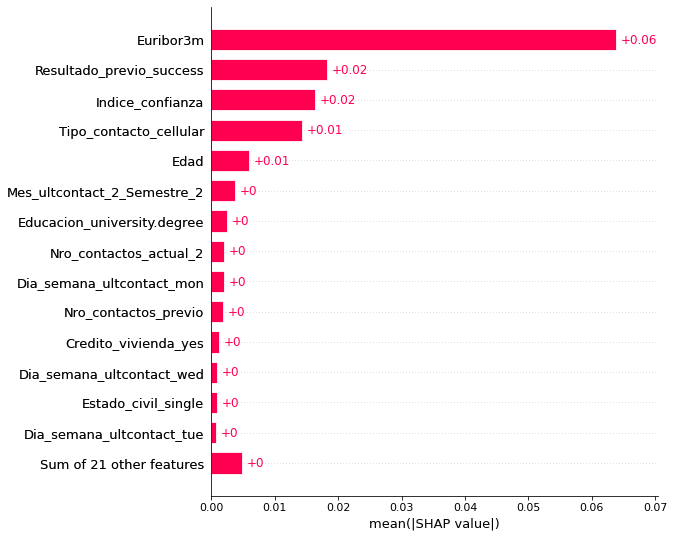

In [87]:
# Importancia global
shap.plots.bar(shap_values_rforest[:,:,1],max_display=15)

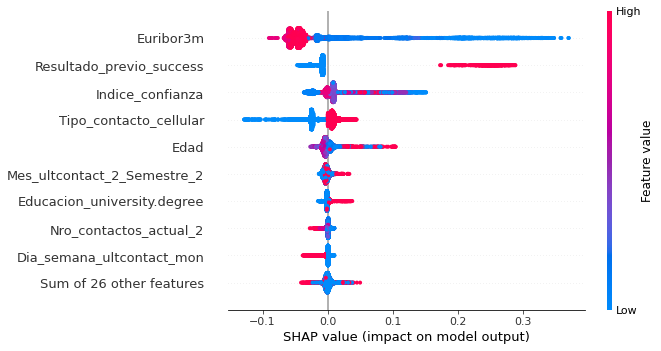

In [88]:
shap.plots.beeswarm(shap_values_rforest[:,:,1])

**OBSERVACIÓN #0**

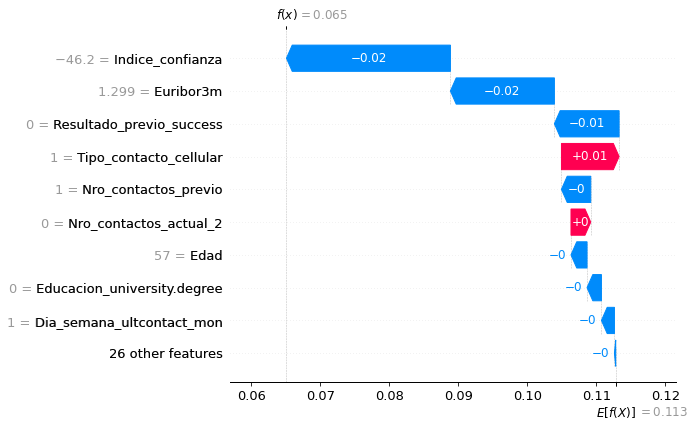

In [89]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][0])

In [90]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][0])

**OBSERVACIÓN #58**

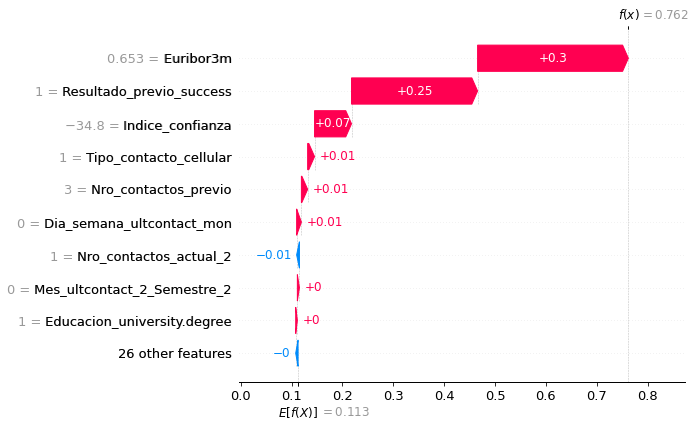

In [91]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][58])

In [92]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][58])

**OBSERVACIÓN #32**

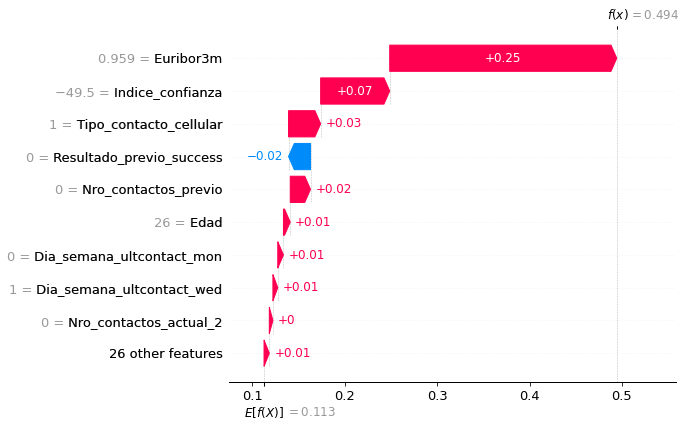

In [93]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][32])

In [94]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][32])

**OBSERVACIÓN #217**

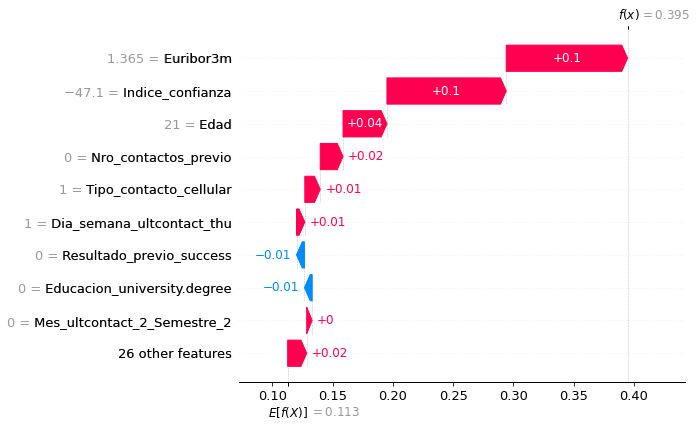

In [95]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][217])

In [96]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][217])

**OBSERVACIÓN #4**

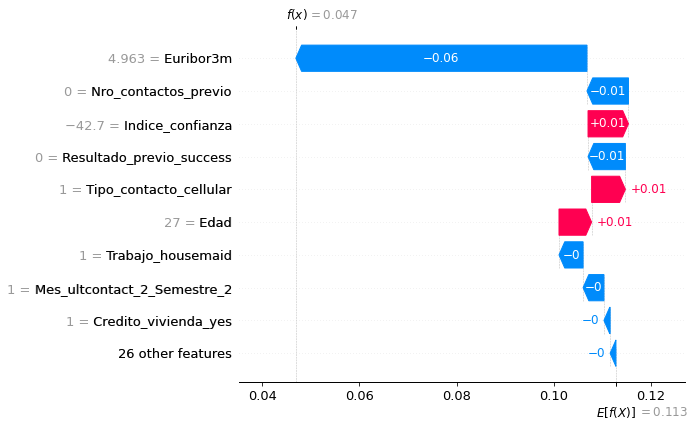

In [97]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][4])

In [98]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][4])

**OBSERVACIÓN #22**

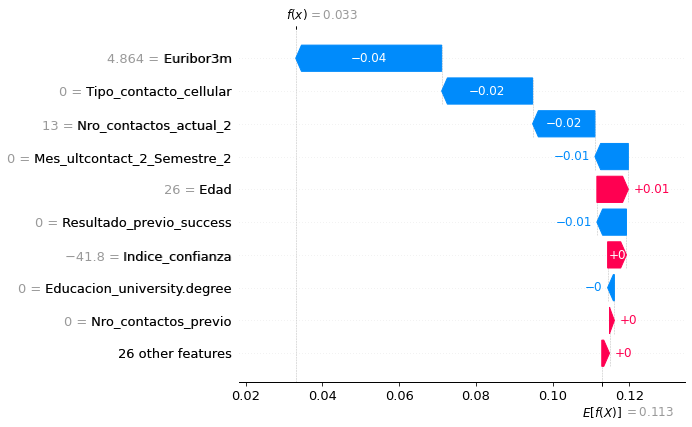

In [99]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_rforest[:,:,1][22])

In [100]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_rforest[:,:,1][22])

# **SHAP - XGBOOST**

In [101]:
pip install shap

In [102]:
import shap

In [103]:
# explicar las predicciones del modelo usando SHAP
explainer_shap_xgboost = shap.Explainer(modelo_xgb)

NPY_ARRAY_UPDATEIFCOPY, NPY_ARRAY_INOUT_ARRAY, and NPY_ARRAY_INOUT_FARRAY are deprecated, use NPY_WRITEBACKIFCOPY, NPY_ARRAY_INOUT_ARRAY2, or NPY_ARRAY_INOUT_FARRAY2 respectively instead, and call PyArray_ResolveWritebackIfCopy before the array is deallocated, i.e. before the last call to Py_DECREF.
UPDATEIFCOPY detected in array_dealloc.  Required call to PyArray_ResolveWritebackIfCopy or PyArray_DiscardWritebackIfCopy is missing


In [104]:
shap_values_xgboost = explainer_shap_xgboost(X_test)

In [105]:
# Convirtiendo el array con los shap values a un Dataframe
datos_valores_shap_xgboost=pd.DataFrame(shap_values_xgboost.values, columns=X_test.columns, index=X_test.index)
datos_valores_shap_xgboost.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Nro_contactos_actual_2,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Estado_civil_divorced,Estado_civil_single,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_yes,Credito_prestamo_yes,Tipo_contacto_cellular,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_success,Mes_ultcontact_2_Semestre_2
32884,0.043686,-0.203653,-0.250539,0.097619,0.061815,-0.015296,0.014482,0.0,0.001298,-0.000928,0.000178,0.002789,0.001253,-0.001749,0.032299,-0.000201,0.000015,-0.000207,-0.001785,-0.000366,0.004038,0.000690,-0.002426,-0.028079,-0.000069,0.010225,0.028584,0.080415,0.001890,-0.064512,0.000483,-0.010437,-0.016649,-0.081994,-0.061573
3169,-0.058792,0.032003,-0.013538,-0.369748,0.028242,-0.005175,0.003836,0.0,0.003954,-0.000845,0.000178,0.003546,-0.001748,-0.002159,-0.001211,0.000277,0.000035,-0.002897,0.000430,-0.000628,-0.000730,-0.000187,0.001490,-0.018471,-0.011707,-0.005601,-0.004929,-0.179352,0.002107,0.023566,-0.001135,-0.003700,-0.015523,-0.050370,-0.458939
32206,0.032176,-0.270976,-0.257817,0.019554,0.038644,-0.004608,-0.076204,0.0,0.002223,-0.000503,0.000178,0.001619,0.001253,-0.001749,-0.005843,-0.000411,0.000254,-0.005437,0.002438,-0.002113,-0.036942,-0.000187,-0.002936,-0.022462,-0.000004,0.043448,-0.000690,0.070131,-0.045105,0.036025,0.000368,-0.011092,-0.018473,-0.079814,-0.068450
9403,-0.032743,0.043115,0.113883,-0.532361,-0.005120,0.005074,0.004223,0.0,0.005511,-0.000766,0.000178,-0.002597,0.000431,-0.001351,0.004205,-0.000230,-0.003076,0.003207,0.002496,-0.000538,-0.000453,0.019789,0.001423,-0.013004,0.000466,0.030550,-0.000455,-0.177918,-0.008750,0.021766,-0.000435,-0.047097,-0.015768,-0.032356,-0.189196
14020,0.091538,0.066765,0.125762,-0.965222,0.011617,-0.015001,0.005522,0.0,-0.243032,-0.000707,0.000178,-0.001642,0.001080,-0.001291,-0.001318,-0.000350,-0.000016,0.006485,0.002512,-0.002043,0.000641,0.000690,-0.000392,-0.012731,0.000451,-0.025815,0.000659,0.051747,-0.007344,0.024792,-0.040140,-0.008372,-0.030037,-0.039244,0.098896


In [106]:
#convirtiendo target a data frame
df_y_test=pd.DataFrame(y_test)
df_pred_proba_modelo_xgb_test=pd.DataFrame(predicciones_xgb_test, columns=['Pred_proba_0','Pred_proba_1'], index=X_test.index)
df_pred_modelo_xgb_test=pd.DataFrame(clasificacion_xgb_test, columns=['Pred_clase'], index=X_test.index)

#concatenando
datos_valores_shap_xgboost_v2 = concat([datos_valores_shap_xgboost,df_y_test,df_pred_proba_modelo_xgb_test,df_pred_modelo_xgb_test],join="inner",axis=1)
datos_valores_shap_xgboost_v2.shape

(12357, 39)

In [107]:
datos_valores_shap_xgboost_v2.head()

,Edad,Nro_contactos_previo,Indice_confianza,Euribor3m,Nro_contactos_actual_2,Trabajo_admin.,Trabajo_blue-collar,Trabajo_entrepreneur,Trabajo_housemaid,Trabajo_management,Trabajo_retired,Trabajo_self-employed,Trabajo_services,Trabajo_student,Trabajo_technician,Trabajo_unemployed,Estado_civil_divorced,Estado_civil_single,Educacion_basic.4y,Educacion_basic.6y,Educacion_basic.9y,Educacion_high.school,Educacion_professional.course,Educacion_university.degree,Educacion_unknown,Credito_vivienda_yes,Credito_prestamo_yes,Tipo_contacto_cellular,Dia_semana_ultcontact_fri,Dia_semana_ultcontact_mon,Dia_semana_ultcontact_thu,Dia_semana_ultcontact_tue,Dia_semana_ultcontact_wed,Resultado_previo_success,Mes_ultcontact_2_Semestre_2,Suscripcion,Pred_proba_0,Pred_proba_1,Pred_clase
32884,0.043686,-0.203653,-0.250539,0.097619,0.061815,-0.015296,0.014482,0.0,0.001298,-0.000928,0.000178,0.002789,0.001253,-0.001749,0.032299,-0.000201,0.000015,-0.000207,-0.001785,-0.000366,0.004038,0.000690,-0.002426,-0.028079,-0.000069,0.010225,0.028584,0.080415,0.001890,-0.064512,0.000483,-0.010437,-0.016649,-0.081994,-0.061573,0,0.929148,0.070852,0
3169,-0.058792,0.032003,-0.013538,-0.369748,0.028242,-0.005175,0.003836,0.0,0.003954,-0.000845,0.000178,0.003546,-0.001748,-0.002159,-0.001211,0.000277,0.000035,-0.002897,0.000430,-0.000628,-0.000730,-0.000187,0.001490,-0.018471,-0.011707,-0.005601,-0.004929,-0.179352,0.002107,0.023566,-0.001135,-0.003700,-0.015523,-0.050370,-0.458939,0,0.965199,0.034801,0
32206,0.032176,-0.270976,-0.257817,0.019554,0.038644,-0.004608,-0.076204,0.0,0.002223,-0.000503,0.000178,0.001619,0.001253,-0.001749,-0.005843,-0.000411,0.000254,-0.005437,0.002438,-0.002113,-0.036942,-0.000187,-0.002936,-0.022462,-0.000004,0.043448,-0.000690,0.070131,-0.045105,0.036025,0.000368,-0.011092,-0.018473,-0.079814,-0.068450,0,0.946772,0.053228,0
9403,-0.032743,0.043115,0.113883,-0.532361,-0.005120,0.005074,0.004223,0.0,0.005511,-0.000766,0.000178,-0.002597,0.000431,-0.001351,0.004205,-0.000230,-0.003076,0.003207,0.002496,-0.000538,-0.000453,0.019789,0.001423,-0.013004,0.000466,0.030550,-0.000455,-0.177918,-0.008750,0.021766,-0.000435,-0.047097,-0.015768,-0.032356,-0.189196,0,0.953597,0.046403,0
14020,0.091538,0.066765,0.125762,-0.965222,0.011617,-0.015001,0.005522,0.0,-0.243032,-0.000707,0.000178,-0.001642,0.001080,-0.001291,-0.001318,-0.000350,-0.000016,0.006485,0.002512,-0.002043,0.000641,0.000690,-0.000392,-0.012731,0.000451,-0.025815,0.000659,0.051747,-0.007344,0.024792,-0.040140,-0.008372,-0.030037,-0.039244,0.098896,0,0.957724,0.042276,0


In [108]:
datos_valores_shap_xgboost_v2.to_excel('/content/drive/MyDrive/Base_TFM/valores_shap_xgboost_v2.xlsx')

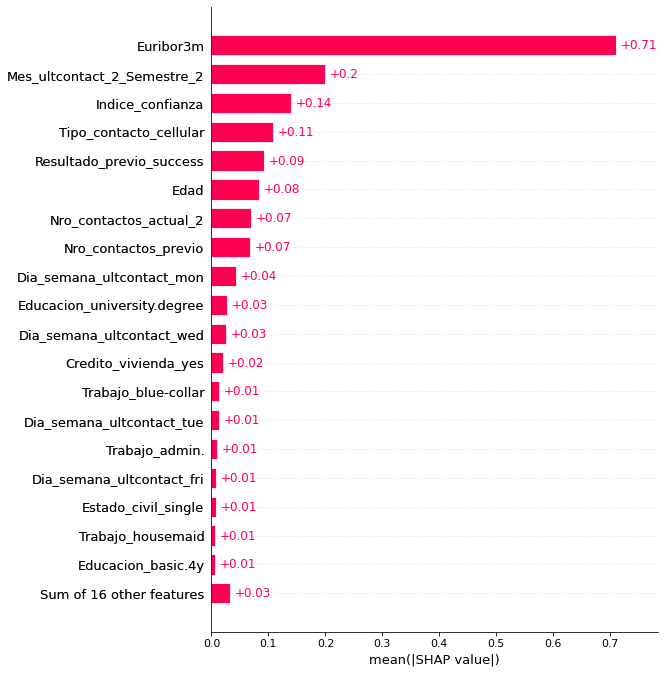

In [109]:
shap.plots.bar(shap_values_xgboost,max_display=20)

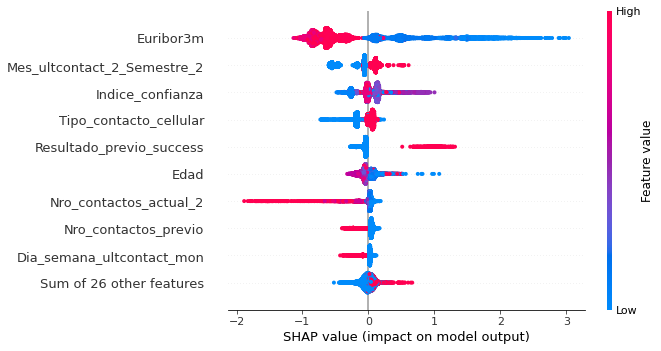

In [110]:
shap.plots.beeswarm(shap_values_xgboost)

**OBSERVACIÓN #0**

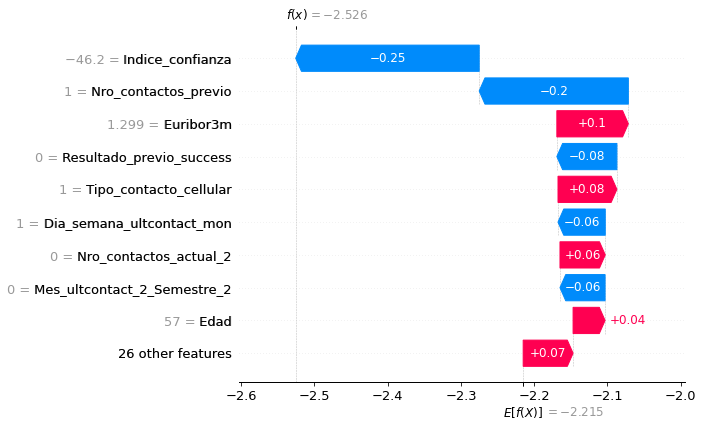

In [111]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[0])

In [112]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[0])

**OBSERVACIÓN #58**

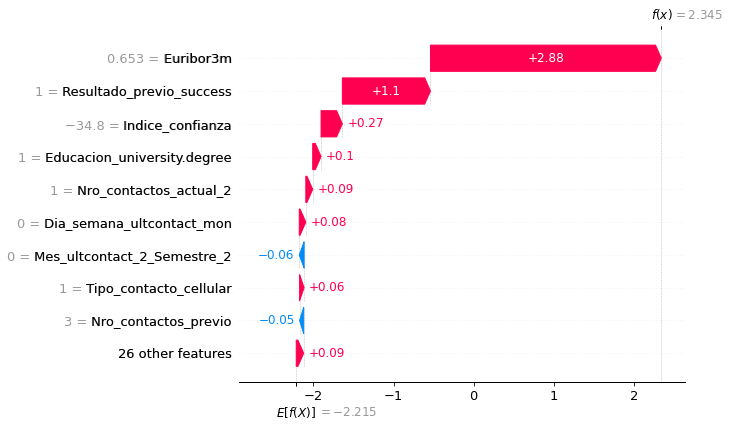

In [113]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[58])

In [114]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[58])

**OBSERVACIÓN #32**

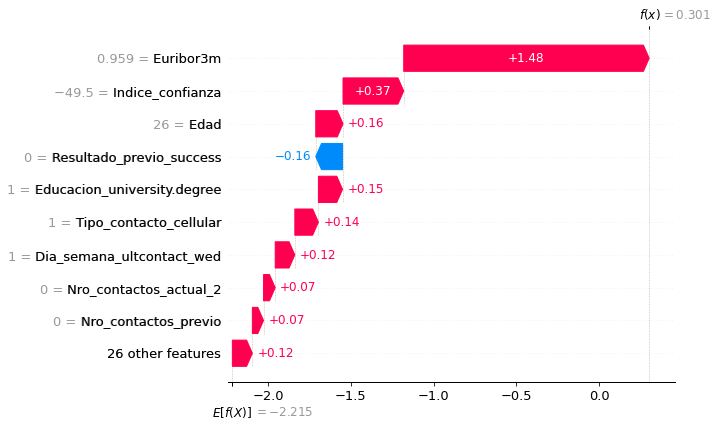

In [115]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[32])

In [116]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[32])

**OBSERVACIÓN #217**

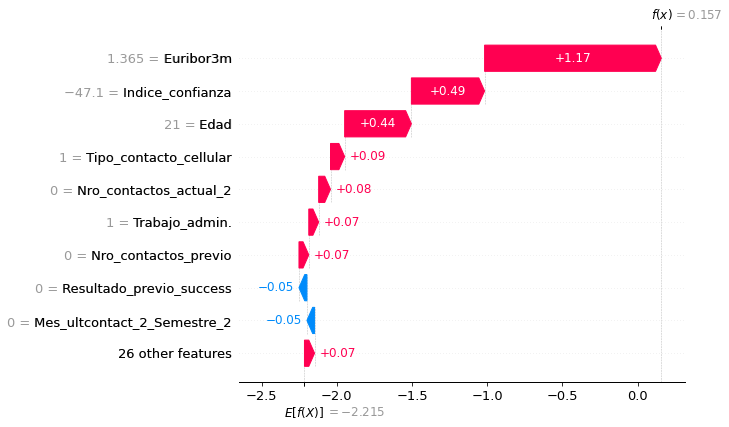

In [117]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[217])

In [118]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[217])

**OBSERVACIÓN #4**

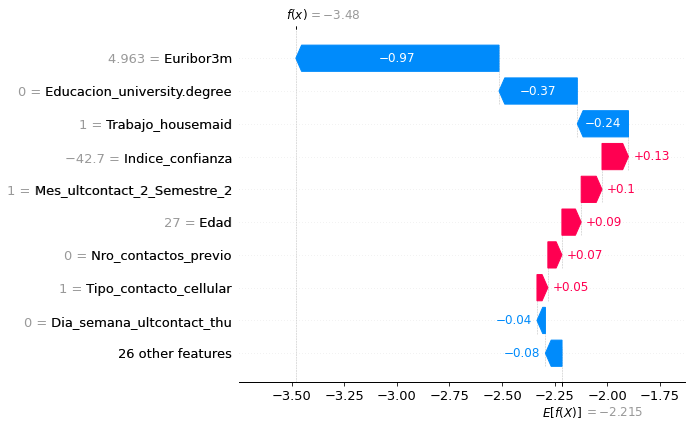

In [119]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[4])

In [120]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[4])

**OBSERVACIÓN #22**

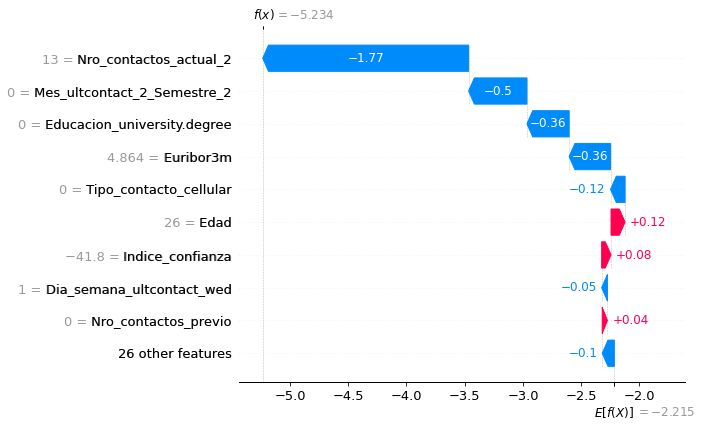

In [121]:
# visualizar la explicación de la primera predicción
shap.plots.waterfall(shap_values_xgboost[22])

In [122]:
# Visualizar la explicación de la primera predicción con una parcela fuerza
shap.initjs()
shap.plots.force(shap_values_xgboost[22])

# **DESARROLLANDO ARBOL DE DECISIÓN**

In [123]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix

In [124]:
# Creación del modelo
n=X_train.shape[0]
min_samples_split=round(n*0.05)
min_samples_leaf=round(n*0.03)

modelo_arbol = DecisionTreeClassifier(
            max_depth         = 5,
            criterion         = 'gini',
            min_samples_split = min_samples_split,
            min_samples_leaf  = min_samples_leaf,
            random_state      = 123
          )

# Entrenamiento del modelo
modelo_arbol.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=865, min_samples_split=1442,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

Profundidad del árbol: 5
Número de nodos terminales: 16


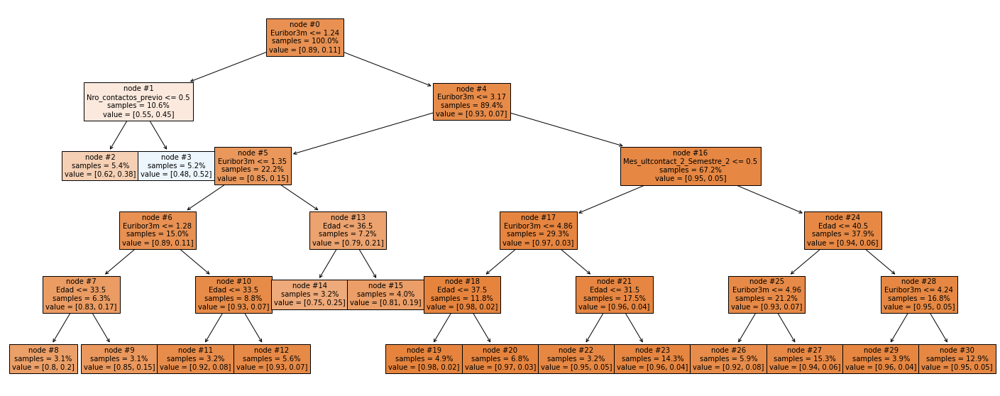

In [125]:
# Estructura del árbol creado
labels=X_train.columns

fig, ax = plt.subplots(figsize=(25, 10))

print(f"Profundidad del árbol: {modelo_arbol.get_depth()}")
print(f"Número de nodos terminales: {modelo_arbol.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo_arbol,
            feature_names = labels.tolist(),
            filled        = True,
            impurity      = False,
            node_ids      = True,
            fontsize      = 10,
            proportion    = True,
            precision     = 2,
            ax            = ax
       )

In [126]:
# predicciones
predicciones_arbol_train = modelo_arbol.predict(X = X_train,)
predicciones_arbol_test = modelo_arbol.predict(X = X_test,)

In [127]:
# Matriz de confusión de las predicciones de TRAIN
confusion_matrix_arbol_train = pd.crosstab(
    y_train.ravel(),
    predicciones_arbol_train,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_arbol_train

Predicción,0,1
Real,,
0,24867,713
1,2467,784


In [128]:
# Matriz de confusión de las predicciones de TRAIN
confusion_matrix_arbol_test = pd.crosstab(
    y_test.ravel(),
    predicciones_arbol_test,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_arbol_test

Predicción,0,1
Real,,
0,10664,304
1,1034,355


In [129]:
# ACCURACY TRAIN
accuracy_arbol_train = accuracy_score(y_true    = y_train, y_pred  = predicciones_arbol_train,   normalize = True )
print(f"El accuracy de train es: {100 * accuracy_arbol_train} %")

El accuracy de train es: 88.97020568138461 %


In [130]:
# PRECISION TRAIN
precision_arbol_train = precision_score( y_true    = y_train, y_pred    = predicciones_arbol_train  )
precision_arbol_train

0.5237140948563794

In [131]:
# RECALL TRAIN
recall_arbol_train = recall_score( y_true    = y_train, y_pred    = predicciones_arbol_train  )
recall_arbol_train

0.2411565672100892

In [132]:
# F1 SCORE TRAIN
f1_score_arbol_train = f1_score( y_true    = y_train, y_pred    = predicciones_arbol_train  )
f1_score_arbol_train

0.33024431339511373

In [133]:
# ACCURACY TEST
accuracy_arbol_test = accuracy_score( y_true    = y_test, y_pred    = predicciones_arbol_test, normalize = True )
print(f"El accuracy de test es: {100 * accuracy_arbol_test} %")

El accuracy de test es: 89.17212915756252 %


In [134]:
# PRECISION TEST
precision_arbol_test= precision_score( y_true    = y_test, y_pred    = predicciones_arbol_test)
precision_arbol_test

0.5386949924127465

In [135]:
# RECALL TEST
recall_arbol_test= recall_score( y_true    = y_test, y_pred    = predicciones_arbol_test)
recall_arbol_test

0.25557955363570917

In [136]:
# F1 SCORE TEST
f1_score_arbol_test= f1_score( y_true    = y_test, y_pred    = predicciones_arbol_test)
f1_score_arbol_test

0.3466796875

In [137]:
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores_arbol = pd.DataFrame(
                            {'predictor': labels.tolist(),
                             'importancia': modelo_arbol.feature_importances_}
                            )
importancia_predictores_arbol.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Euribor3m,0.956182
1,Nro_contactos_previo,0.030432
0,Edad,0.007279
34,Mes_ultcontact_2_Semestre_2,0.006107
4,Nro_contactos_actual_2,0.000000
20,Educacion_basic.9y,0.000000
33,Resultado_previo_success,0.000000
32,Dia_semana_ultcontact_wed,0.000000
31,Dia_semana_ultcontact_tue,0.000000
30,Dia_semana_ultcontact_thu,0.000000


In [138]:
# Predicción de probabilidades
predicciones_arbol_test = modelo_arbol.predict_proba(X = X_test)
predicciones_arbol_test[:5, :]

array([[0.93494424, 0.06505576],
       [0.96148256, 0.03851744],
       [0.91648352, 0.08351648],
       [0.96148256, 0.03851744],
       [0.93977273, 0.06022727]])

# **MODELO REGRESIÓN LOGÍSTICA**

In [139]:
from matplotlib import style
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score
from sklearn.metrics import plot_confusion_matrix
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')


**Iteración 1**

In [140]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
X_train_v1=copy.deepcopy(X_train)
X_train_v1 = sm.add_constant(X_train_v1, prepend=True)
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v1,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287476
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28796
Method:                           MLE   Df Model:                           34
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1839
Time:                        11:48:05   Log-Likelihood:                -8288.2
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.3061        nan        nan        

invalid value encountered in sqrt


In [141]:
# predicciones train
predicciones_logis_train_iter01 = modelo_logis.predict(exog = X_train_v1)
clasificacion_logis_train_iter01 = np.where(predicciones_logis_train_iter01<0.5, 0, 1)

accuracy_logis_train_iter01 = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter01, normalize = True )
precision_logis_train_iter01 = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter01 )
recall_logis_train_iter01 = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter01 )
f1_score_logis_train_iter01 = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter01 )


print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train iter01 es:  {accuracy_logis_train_iter01}")
print(f"El precision de train iter01 es: {precision_logis_train_iter01}")
print(f"El recall de train iter01 es:    {recall_logis_train_iter01}")
print(f"El f1 score de train iter01 es:  {f1_score_logis_train_iter01}")

------- RESULTADOS TRAIN ------------------
El accuracy de train iter01 es:  0.8984079636502376
El precision de train iter01 es: 0.6876456876456877
El recall de train iter01 es:    0.18148262073208243
El f1 score de train iter01 es:  0.28717449501095155


Eliminando variables que resultaron "nan" en el modelo

In [142]:
# eliminando variables x_train 
X_train_v2=copy.deepcopy(X_train_v1)
X_train_v3 = X_train_v2.drop(['Dia_semana_ultcontact_fri'], axis = 1)

# eliminando variables x_test 
X_test_v2=copy.deepcopy(X_test)
X_test_v3 = X_test_v2.drop(['Dia_semana_ultcontact_fri'], axis = 1)


**Iteración 2**

In [143]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
X_train_v3 = sm.add_constant(X_train_v3, prepend=True)
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v3,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287476
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28796
Method:                           MLE   Df Model:                           34
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1839
Time:                        11:49:16   Log-Likelihood:                -8288.2
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.3090      0.884      0.349      0.

In [144]:
# predicciones train
predicciones_logis_train_iter02 = modelo_logis.predict(exog = X_train_v3)
clasificacion_logis_train_iter02 = np.where(predicciones_logis_train_iter02<0.5, 0, 1)

accuracy_logis_train_iter02 = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter02, normalize = True )
precision_logis_train_iter02 = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter02 )
recall_logis_train_iter02 = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter02 )
f1_score_logis_train_iter02 = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter02 )


print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train iter02 es:  {accuracy_logis_train_iter02}")
print(f"El precision de train iter02 es: {precision_logis_train_iter02}")
print(f"El recall de train iter02 es:    {recall_logis_train_iter02}")
print(f"El f1 score de train iter02 es:  {f1_score_logis_train_iter02}")

------- RESULTADOS TRAIN ------------------
El accuracy de train iter02 es:  0.8984079636502376
El precision de train iter02 es: 0.6876456876456877
El recall de train iter02 es:    0.18148262073208243
El f1 score de train iter02 es:  0.28717449501095155


Eliminando variables con p valor mayor 0.7

In [145]:
# eliminando variables x_train 
X_train_v4=copy.deepcopy(X_train_v3)
X_train_v5 = X_train_v4.drop(['Edad','Trabajo_blue-collar','Estado_civil_divorced'], axis = 1)

# eliminando variables x_test 
X_test_v4=copy.deepcopy(X_test_v3)
X_test_v5 = X_test_v4.drop(['Edad','Trabajo_blue-collar','Estado_civil_divorced'], axis = 1)

**Iteración 3**

In [146]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
X_train_v5 = sm.add_constant(X_train_v5, prepend=True)
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v5,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287480
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28799
Method:                           MLE   Df Model:                           31
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1839
Time:                        11:49:53   Log-Likelihood:                -8288.3
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.4051      0.839      0.483      0.

In [147]:
# predicciones train
predicciones_logis_train_iter03 = modelo_logis.predict(exog = X_train_v5)
clasificacion_logis_train_iter03 = np.where(predicciones_logis_train_iter03<0.5, 0, 1)

accuracy_logis_train_iter03 = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter03, normalize = True )
precision_logis_train_iter03 = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter03 )
recall_logis_train_iter03 = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter03 )
f1_score_logis_train_iter03 = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter03 )


print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train iter03 es:  {accuracy_logis_train_iter03}")
print(f"El precision de train iter03 es: {precision_logis_train_iter03}")
print(f"El recall de train iter03 es:    {recall_logis_train_iter03}")
print(f"El f1 score de train iter03 es:  {f1_score_logis_train_iter03}")

------- RESULTADOS TRAIN ------------------
El accuracy de train iter03 es:  0.8983732787624432
El precision de train iter03 es: 0.6877192982456141
El recall de train iter03 es:    0.1808674254075669
El f1 score de train iter03 es:  0.2864101315148563


Eliminando variables con p valor mayor 0.5

In [148]:
# eliminando variables x_train 
X_train_v6=copy.deepcopy(X_train_v5)
X_train_v7 = X_train_v6.drop(['Trabajo_entrepreneur','Trabajo_housemaid','Trabajo_self-employed','Credito_prestamo_yes'], axis = 1)

# eliminando variables x_test 
X_test_v6=copy.deepcopy(X_test_v5)
X_test_v7 = X_test_v6.drop(['Trabajo_entrepreneur','Trabajo_housemaid','Trabajo_self-employed','Credito_prestamo_yes'], axis = 1)

**Iteración 4**

In [149]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
X_train_v7 = sm.add_constant(X_train_v7, prepend=True)
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v7,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287496
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28803
Method:                           MLE   Df Model:                           27
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1838
Time:                        11:52:17   Log-Likelihood:                -8288.8
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.4524      0.837      0.540      0.

In [150]:
# predicciones train
predicciones_logis_train_iter04 = modelo_logis.predict(exog = X_train_v7)
clasificacion_logis_train_iter04 = np.where(predicciones_logis_train_iter04<0.5, 0, 1)

accuracy_logis_train_iter04 = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter04, normalize = True )
precision_logis_train_iter04 = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter04 )
recall_logis_train_iter04 = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter04 )
f1_score_logis_train_iter04 = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter04 )


print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train iter04 es:  {accuracy_logis_train_iter04}")
print(f"El precision de train iter04 es: {precision_logis_train_iter04}")
print(f"El recall de train iter04 es:    {recall_logis_train_iter04}")
print(f"El f1 score de train iter04 es:  {f1_score_logis_train_iter04}")

------- RESULTADOS TRAIN ------------------
El accuracy de train iter04 es:  0.8984079636502376
El precision de train iter04 es: 0.6880841121495327
El recall de train iter04 es:    0.18117502306982466
El f1 score de train iter04 es:  0.286827367908449


Eliminando variables con p valor mayor 0.3 y la constante

In [151]:
# eliminando variables x_train 
X_train_v8=copy.deepcopy(X_train_v7)
X_train_v9 = X_train_v8.drop(['Trabajo_management','Trabajo_services','Educacion_basic.4y','Educacion_basic.6y','Educacion_professional.course',
                              'Educacion_university.degree','Educacion_unknown'], axis = 1)

# eliminando variables x_test 
X_test_v8=copy.deepcopy(X_test_v7)
X_test_v9 = X_test_v8.drop(['Trabajo_management','Trabajo_services','Educacion_basic.4y','Educacion_basic.6y','Educacion_professional.course',
                            'Educacion_university.degree','Educacion_unknown'], axis = 1)

**Iteración 5**

In [152]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
X_train_v9 = sm.add_constant(X_train_v9, prepend=True)
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v9,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287691
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28810
Method:                           MLE   Df Model:                           20
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1833
Time:                        11:52:29   Log-Likelihood:                -8294.4
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -0.2524      0.193     -1.307      0.191   

In [153]:
# predicciones train
predicciones_logis_train_iter05 = modelo_logis.predict(exog = X_train_v9)
clasificacion_logis_train_iter05 = np.where(predicciones_logis_train_iter05<0.5, 0, 1)

accuracy_logis_train_iter05 = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter05, normalize = True )
precision_logis_train_iter05 = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter05 )
recall_logis_train_iter05 = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter05 )
f1_score_logis_train_iter05 = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train_iter05 )


print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train iter05 es:  {accuracy_logis_train_iter05}")
print(f"El precision de train iter05 es: {precision_logis_train_iter05}")
print(f"El recall de train iter05 es:    {recall_logis_train_iter05}")
print(f"El f1 score de train iter05 es:  {f1_score_logis_train_iter05}")

------- RESULTADOS TRAIN ------------------
El accuracy de train iter05 es:  0.8981651694356769
El precision de train iter05 es: 0.6833527357392316
El recall de train iter05 es:    0.18055982774530913
El f1 score de train iter05 es:  0.2856447688564477


Eliminando variables con p valor mayor 0.05 y la constante

In [154]:
# eliminando variables x_train 
X_train_v10=copy.deepcopy(X_train_v9)
X_train_v11 = X_train_v10.drop(['Credito_vivienda_yes','Dia_semana_ultcontact_mon','Dia_semana_ultcontact_tue','Estado_civil_single','const'], axis = 1)

# eliminando variables x_test 
X_test_v10=copy.deepcopy(X_test_v9)
X_test_v11 = X_test_v10.drop(['Credito_vivienda_yes','Dia_semana_ultcontact_mon','Dia_semana_ultcontact_tue','Estado_civil_single'], axis = 1)

**Iteración 6**

In [155]:
# A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
modelo_logis = sm.Logit(endog=y_train, exog=X_train_v11,)
modelo_logis = modelo_logis.fit()
print(modelo_logis.summary())

Optimization terminated successfully.
         Current function value: 0.287997
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:            Suscripcion   No. Observations:                28831
Model:                          Logit   Df Residuals:                    28815
Method:                           MLE   Df Model:                           15
Date:                Wed, 22 Sep 2021   Pseudo R-squ.:                  0.1824
Time:                        11:53:15   Log-Likelihood:                -8303.2
converged:                       True   LL-Null:                       -10156.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Nro_contactos_previo           -0.1204      0.038     -3.196      0.001   

In [156]:
# predicciones train
predicciones_logis_train = modelo_logis.predict(exog = X_train_v11)
clasificacion_logis_train = np.where(predicciones_logis_train<0.5, 0, 1)

accuracy_logis_train = accuracy_score( y_true    = y_train, y_pred    = clasificacion_logis_train, normalize = True )
precision_logis_train = precision_score( y_true    = y_train, y_pred    = clasificacion_logis_train )
recall_logis_train = recall_score( y_true    = y_train, y_pred    = clasificacion_logis_train )
f1_score_logis_train = f1_score( y_true    = y_train, y_pred    = clasificacion_logis_train )

# predicciones test
predicciones_logis_test = modelo_logis.predict(exog = X_test_v11)
clasificacion_logis_test = np.where(predicciones_logis_test<0.5, 0, 1)

accuracy_logis_test = accuracy_score( y_true    = y_test,  y_pred    = clasificacion_logis_test,  normalize = True  )
precision_logis_test = precision_score( y_true    = y_test,  y_pred    = clasificacion_logis_test)
recall_logis_test = recall_score( y_true    = y_test,  y_pred    = clasificacion_logis_test)
f1_score_logis_test = f1_score( y_true    = y_test,  y_pred    = clasificacion_logis_test)

print(f"------- RESULTADOS TRAIN ------------------")
print(f"El accuracy de train es:  {accuracy_logis_train}")
print(f"El precision de train es: {precision_logis_train}")
print(f"El recall de train es:    {recall_logis_train}")
print(f"El f1 score de train es:  {f1_score_logis_train}")

print(f"------- RESULTADOS TEST ------------------")
print(f"El accuracy de test es:  {accuracy_logis_test}")
print(f"El precision de test es: {precision_logis_test}")
print(f"El recall de test es:    {recall_logis_test}")
print(f"El f1 score de test es:  {f1_score_logis_test}")

------- RESULTADOS TRAIN ------------------
El accuracy de train es:  0.8983385938746488
El precision de train es: 0.684331797235023
El recall de train es:    0.1827130113811135
El f1 score de train es:  0.2884195193008012
------- RESULTADOS TEST ------------------
El accuracy de test es:  0.8994901675163874
El precision de test es: 0.6919060052219321
El recall de test es:    0.19078473722102232
El f1 score de test es:  0.299097065462754


In [157]:
# Matriz de confusión de las predicciones de TRAIN
confusion_matrix_logis_train = pd.crosstab(
    y_train.ravel(),
    clasificacion_logis_train,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_logis_train

Predicción,0,1
Real,,
0,25306,274
1,2657,594


In [158]:
# Matriz de confusión de las predicciones de TEST
confusion_matrix_logis_test = pd.crosstab(
    y_test.ravel(),
    clasificacion_logis_test,
    rownames=['Real'],
    colnames=['Predicción']
)
confusion_matrix_logis_test

Predicción,0,1
Real,,
0,10850,118
1,1124,265
